# Dataset Exploration, Splitting, and Verification

This notebook performs the following steps:
1.  **EDA**: Explore the dataset structure, class distribution, and bounding box statistics.
2.  **Visualization**: Visualize sample images with their bounding boxes.
3.  **Splitting**: Split the dataset into Train, Validation, and Test sets.
4.  **Verification**: Verify the split dataset by visualizing samples from the new directories.

In [9]:
import os
import glob
import shutil
import random
import cv2
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
from tqdm import tqdm

# Configuration
DATASET_DIR = r'../dataset-V1' # Path to original dataset
IMAGES_DIR = os.path.join(DATASET_DIR, 'images')
LABELS_DIR = os.path.join(DATASET_DIR, 'labels')
OUTPUT_DIR = r'../dataset_split-V1' # Path where split data will be saved

# Classes (Update this list if you have specific class names, otherwise we'll infer IDs)
# For YOLO, classes are usually 0-indexed integers in the text files.
CLASS_NAMES = {0: 'smoke', 1: 'fire', -1: 'Background'} # Added Background for negative examples

print(f"Dataset Directory: {os.path.abspath(DATASET_DIR)}")

Dataset Directory: d:\YOLO_WildFire\dataset-V1


## 1. EDA: Data Integrity and Distribution

In [10]:
image_files = glob.glob(os.path.join(IMAGES_DIR, '*.jpg')) + glob.glob(os.path.join(IMAGES_DIR, '*.png')) + glob.glob(os.path.join(IMAGES_DIR, '*.jpeg'))
label_files = glob.glob(os.path.join(LABELS_DIR, '*.txt'))

print(f"Total Images: {len(image_files)}")
print(f"Total Labels: {len(label_files)}")

# Check for matching pairs
valid_pairs = []
missing_labels = []
missing_images = []

for img_path in tqdm(image_files, desc="Checking pairs"):
    basename = os.path.splitext(os.path.basename(img_path))[0]
    label_path = os.path.join(LABELS_DIR, basename + '.txt')
    if os.path.exists(label_path):
        valid_pairs.append((img_path, label_path))
    else:
        missing_labels.append(img_path)

print(f"Valid Pairs: {len(valid_pairs)}")
print(f"Images without labels: {len(missing_labels)}")
# Note: We are ignoring labels without images for now as we iterate over images.

Total Images: 29752
Total Labels: 29752


Checking pairs: 100%|██████████| 29752/29752 [00:02<00:00, 14577.76it/s]

Valid Pairs: 29752
Images without labels: 0


Analyzing labels: 100%|██████████| 29752/29752 [01:54<00:00, 260.16it/s] 


Class Distribution:
Class Background: 11179
Class fire: 14692
Class smoke: 19044


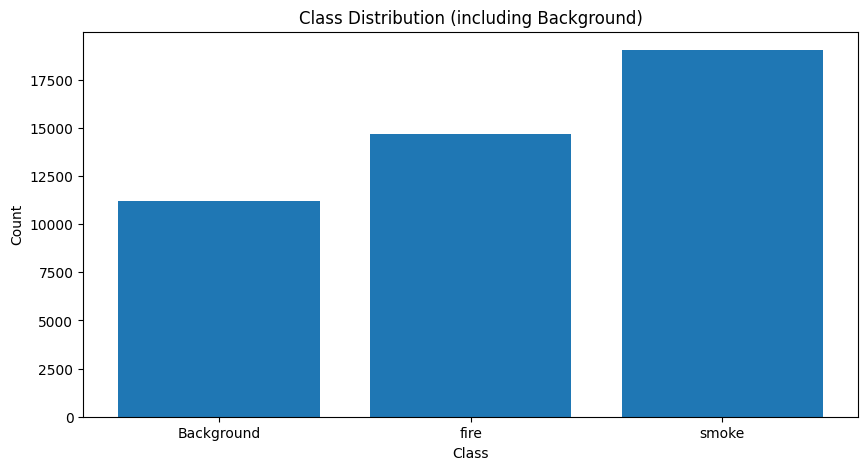

In [11]:
# Analyze Class Distribution
class_counts = Counter()
bbox_widths = []
bbox_heights = []

for _, label_path in tqdm(valid_pairs, desc="Analyzing labels"):
    with open(label_path, 'r') as f:
        lines = f.readlines()
        
        # Check for empty files (Negative/Background examples)
        if not lines or all(line.strip() == '' for line in lines):
            class_counts[-1] += 1
            continue

        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5:
                cls_id = int(parts[0])
                w = float(parts[3])
                h = float(parts[4])
                class_counts[cls_id] += 1
                bbox_widths.append(w)
                bbox_heights.append(h)

print("Class Distribution:")
for cls, count in class_counts.items():
    name = CLASS_NAMES.get(cls, str(cls))
    print(f"Class {name}: {count}")

plt.figure(figsize=(10, 5))
plt.bar([CLASS_NAMES.get(k, str(k)) for k in class_counts.keys()], class_counts.values())
plt.title("Class Distribution (including Background)")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()

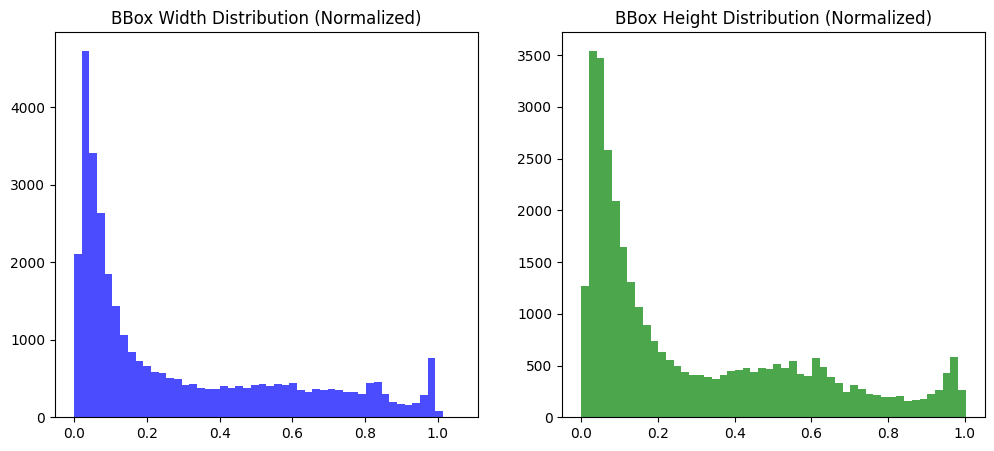

In [12]:
# Analyze BBox Dimensions
if bbox_widths: # Check if we have any bboxes
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.hist(bbox_widths, bins=50, color='blue', alpha=0.7)
    plt.title("BBox Width Distribution (Normalized)")
    plt.subplot(1, 2, 2)
    plt.hist(bbox_heights, bins=50, color='green', alpha=0.7)
    plt.title("BBox Height Distribution (Normalized)")
    plt.show()
else:
    print("No bounding boxes found to analyze dimensions.")

## 2. Visualization

Visualizing: WEB05737.jpg


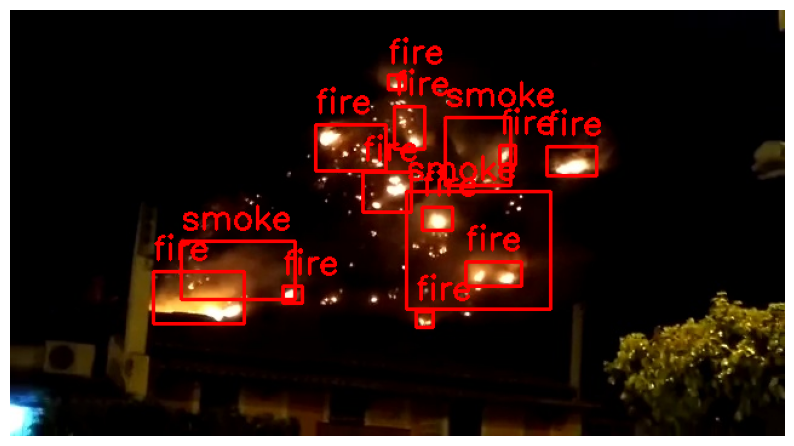

Visualizing: WEB09196.jpg


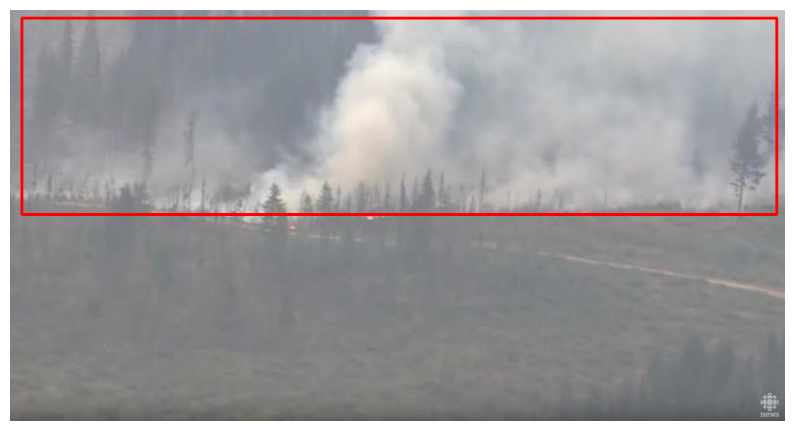

Visualizing: WEB11291.jpg


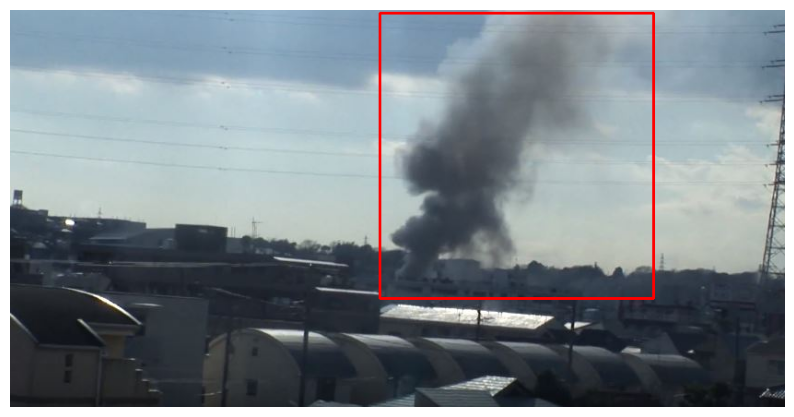

In [13]:
def visualize_sample(img_path, label_path, class_map=CLASS_NAMES):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h_img, w_img, _ = img.shape
    
    with open(label_path, 'r') as f:
        lines = f.readlines()
    
    has_bboxes = False
    for line in lines:
        parts = line.strip().split()
        if len(parts) >= 5:
            has_bboxes = True
            cls_id = int(parts[0])
            x_center, y_center, w, h = map(float, parts[1:5])
            
            # Convert YOLO format to corners
            x1 = int((x_center - w/2) * w_img)
            y1 = int((y_center - h/2) * h_img)
            x2 = int((x_center + w/2) * w_img)
            y2 = int((y_center + h/2) * h_img)
            
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
            label = class_map.get(cls_id, str(cls_id))
            cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
            
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    if not has_bboxes:
        plt.title("Background / Negative Example")
    plt.axis('off')
    plt.show()

# Visualize random samples
import random
for _ in range(3):
    img_p, lbl_p = random.choice(valid_pairs)
    print(f"Visualizing: {os.path.basename(img_p)}")
    visualize_sample(img_p, lbl_p)

## 3. Dataset Splitting

In [ ]:
SPLIT_RATIO = {'train': 0.8, 'valid': 0.1, 'test': 0.1}

def create_split_dirs(base_path):
    for split in ['train', 'valid', 'test']:
        os.makedirs(os.path.join(base_path, split, 'images'), exist_ok=True)
        os.makedirs(os.path.join(base_path, split, 'labels'), exist_ok=True)

create_split_dirs(OUTPUT_DIR)

# Shuffle pairs
random.seed(42)
random.shuffle(valid_pairs)

total_count = len(valid_pairs)
train_end = int(total_count * SPLIT_RATIO['train'])
valid_end = train_end + int(total_count * SPLIT_RATIO['valid'])

train_pairs = valid_pairs[:train_end]
valid_pairs_split = valid_pairs[train_end:valid_end]
test_pairs = valid_pairs[valid_end:]

print(f"Split counts: Train={len(train_pairs)}, Valid={len(valid_pairs_split)}, Test={len(test_pairs)}")

def copy_files(pairs, split_name):
    for img_p, lbl_p in tqdm(pairs, desc=f"Copying {split_name}"):
        shutil.copy(img_p, os.path.join(OUTPUT_DIR, split_name, 'images', os.path.basename(img_p)))
        shutil.copy(lbl_p, os.path.join(OUTPUT_DIR, split_name, 'labels', os.path.basename(lbl_p)))

copy_files(train_pairs, 'train')
copy_files(valid_pairs_split, 'valid')
copy_files(test_pairs, 'test')

print("Dataset split complete!")

## 4. Verification of Split Data


--- Verifying 10 samples from the TRAIN Split ---
Sample 1/10: WEB10878.jpg


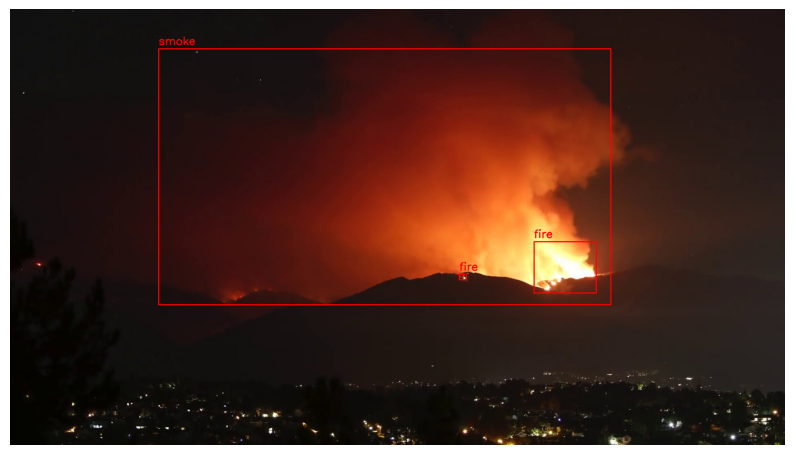

Sample 2/10: WEB04305.jpg


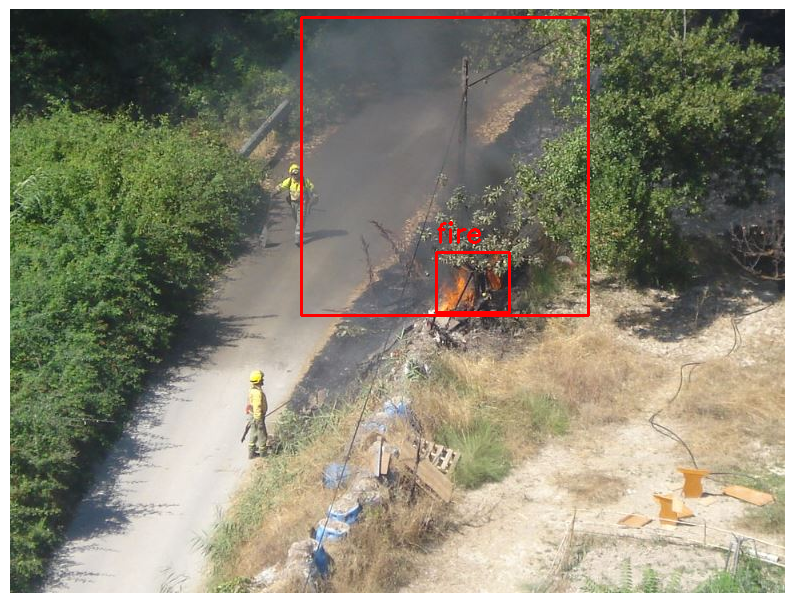

Sample 3/10: WEB01941.jpg


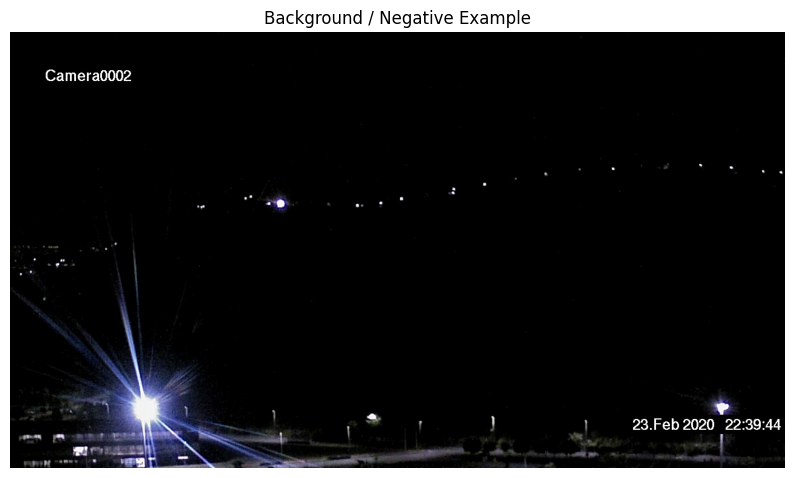

Sample 4/10: WEB04620.jpg


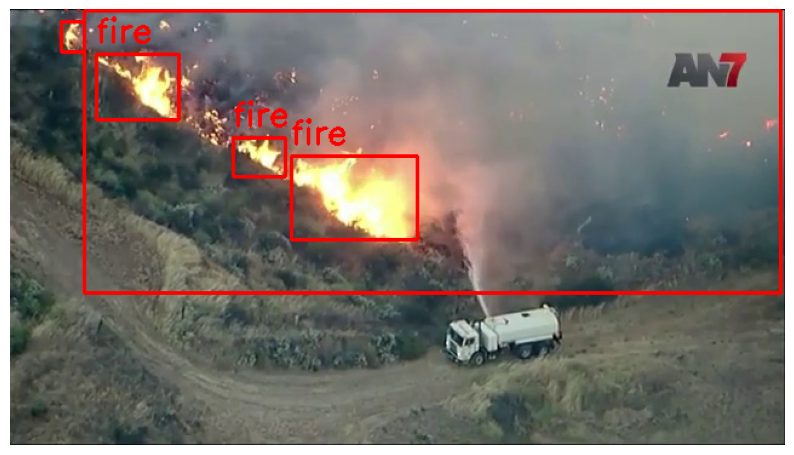

Sample 5/10: ckav2x5ll6i6w0721dla0fo4c.jpeg


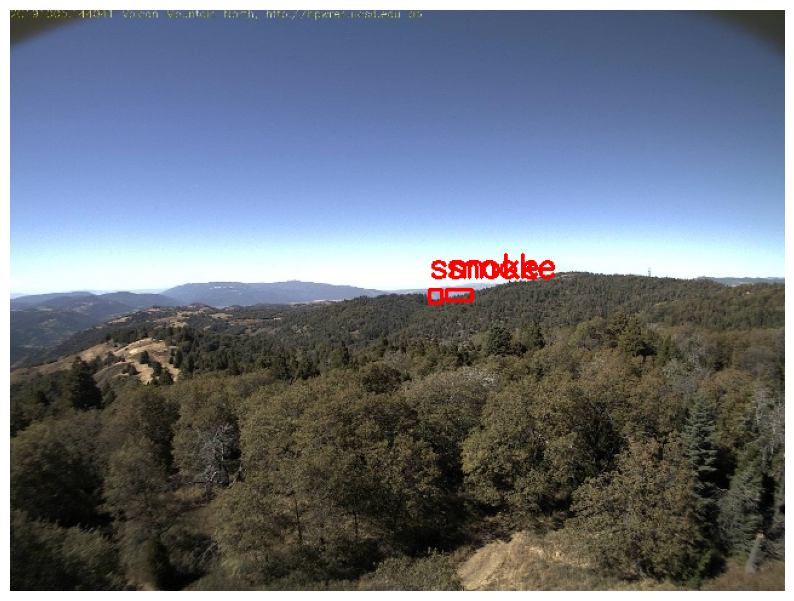

Sample 6/10: AoF02337.jpg


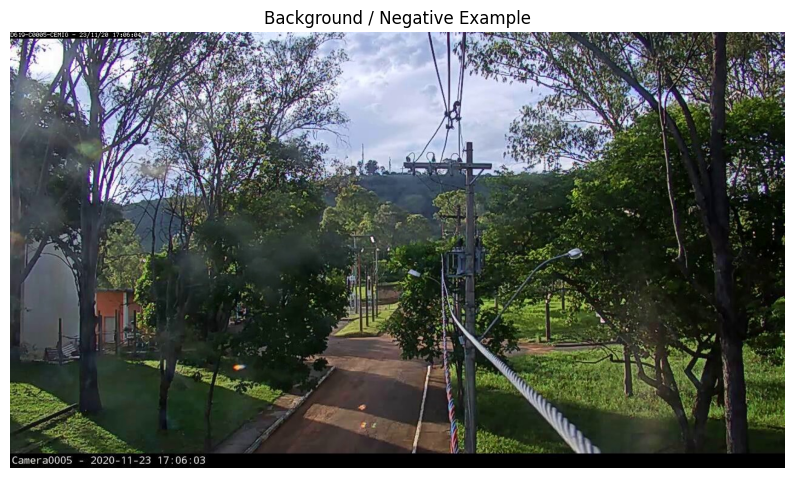

Sample 7/10: WEB09990.jpg


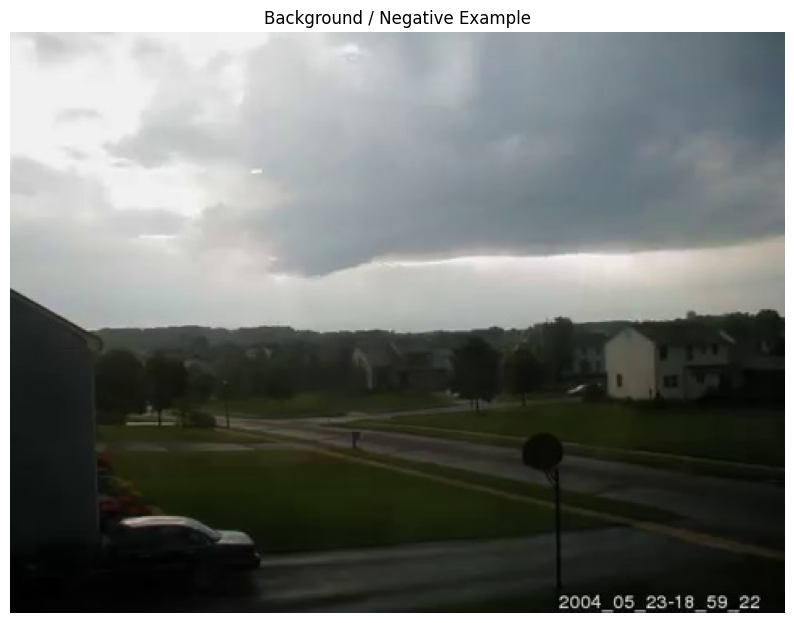

Sample 8/10: AoF02826.jpg


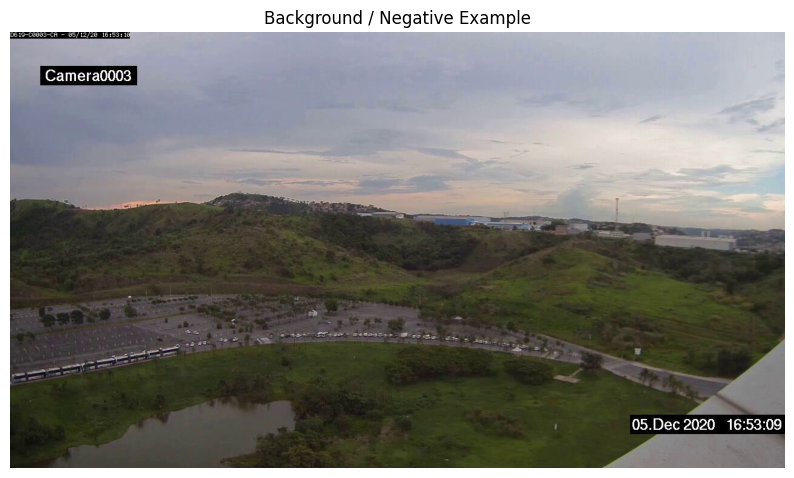

Sample 9/10: AoF04673.jpg


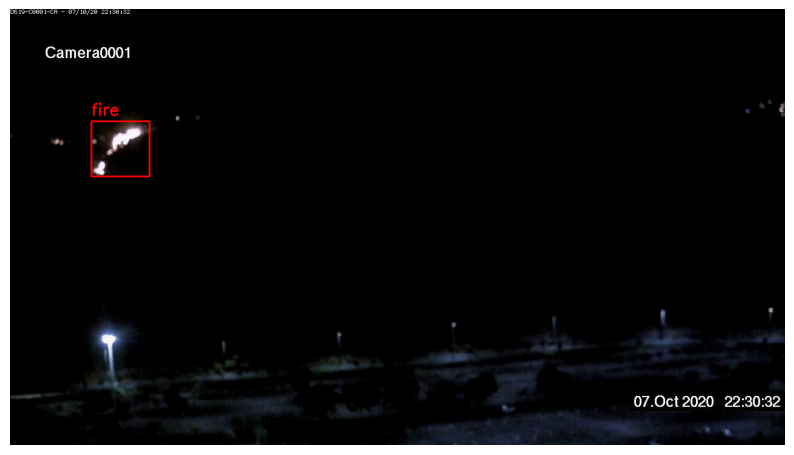

Sample 10/10: syp-w-mobo-c_1607613709.jpg


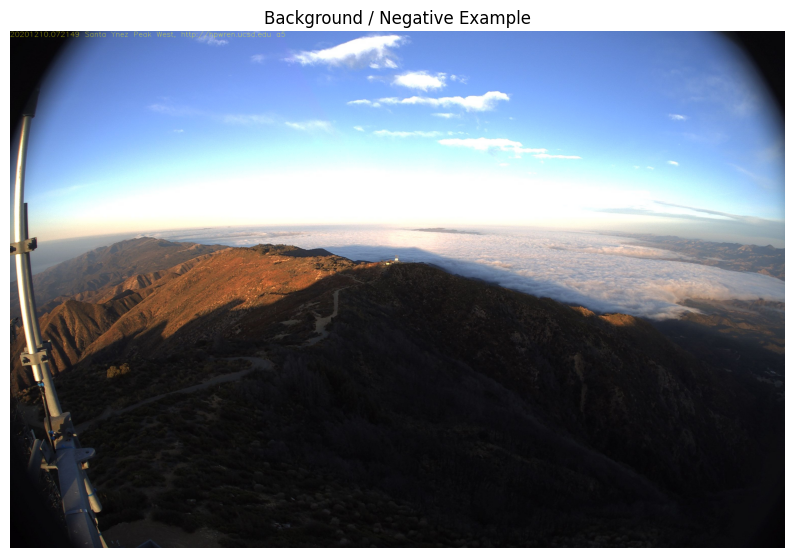


--- Verifying 10 samples from the VALID Split ---
Sample 1/10: WEB08433.jpg


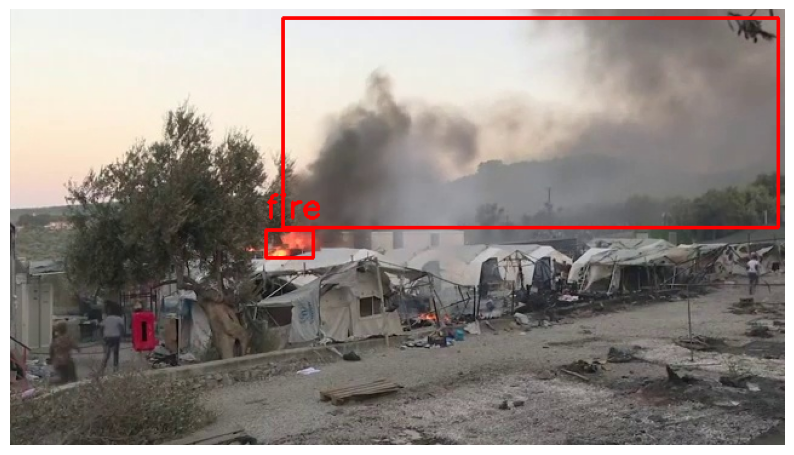

Sample 2/10: ckb38udwqr69s0753ur13uk2v.jpeg


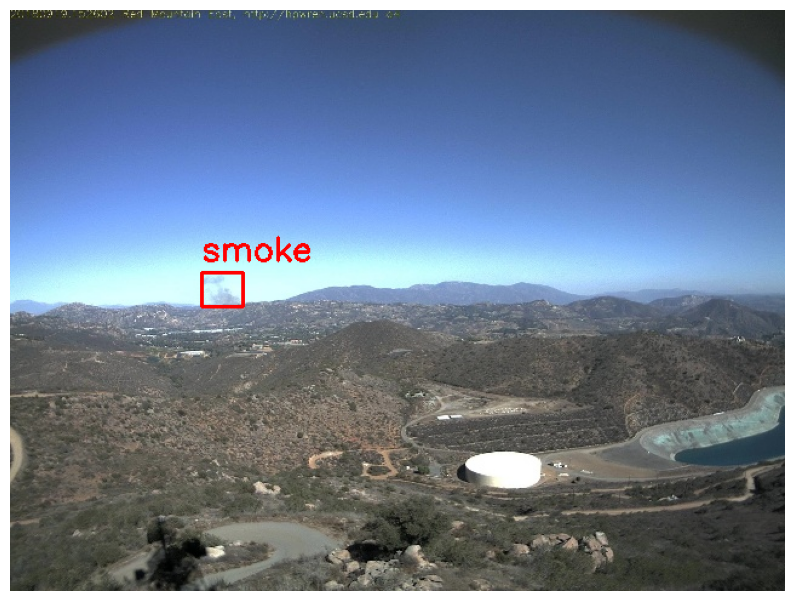

Sample 3/10: AoF02376.jpg


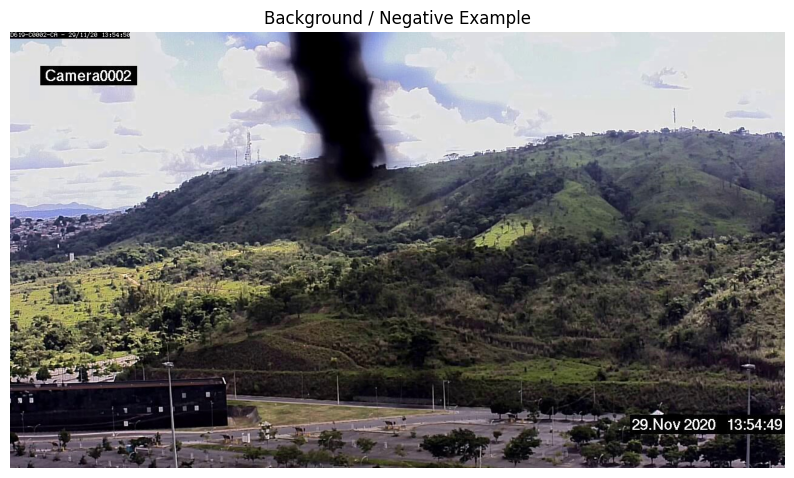

Sample 4/10: WEB07319.jpg


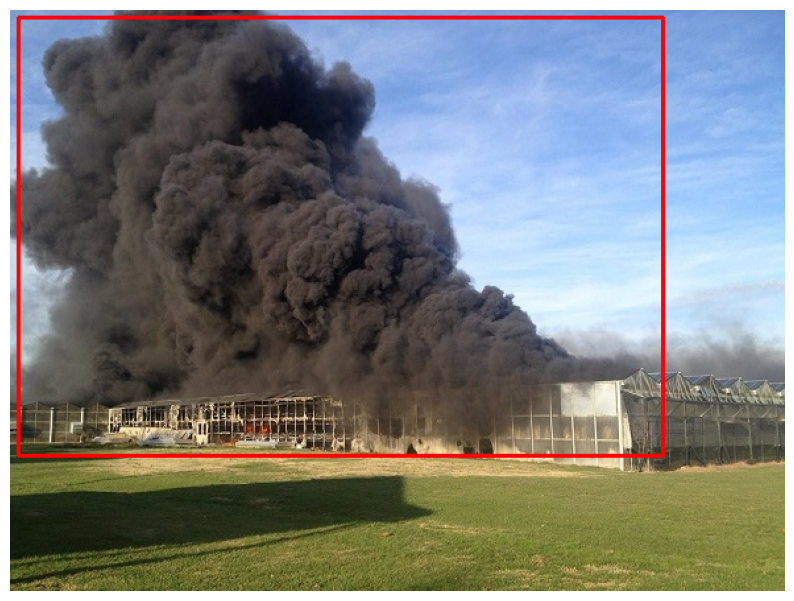

Sample 5/10: heinola_DJI_0033_frame38.jpg


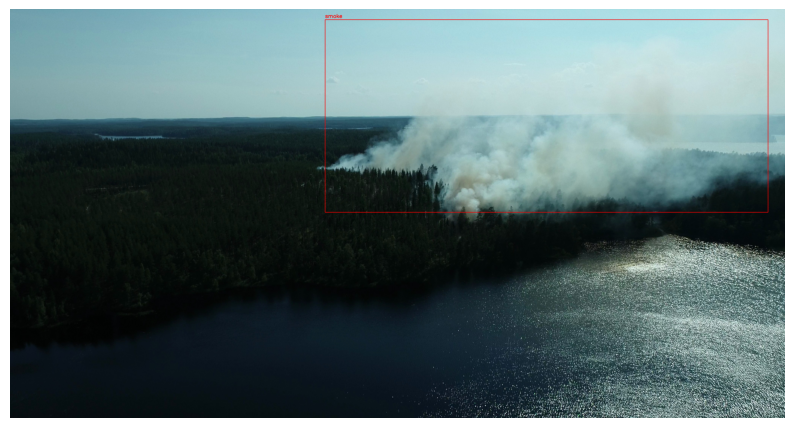

Sample 6/10: WEB10036.jpg


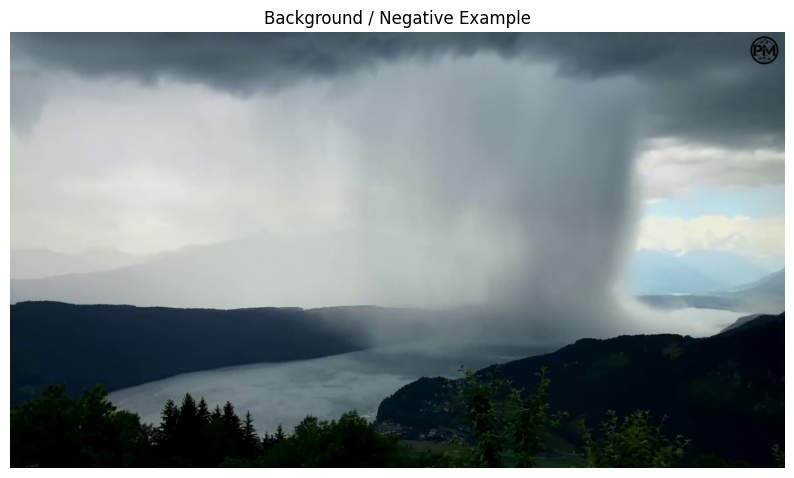

Sample 7/10: syp-w-mobo-c_1607618629.jpg


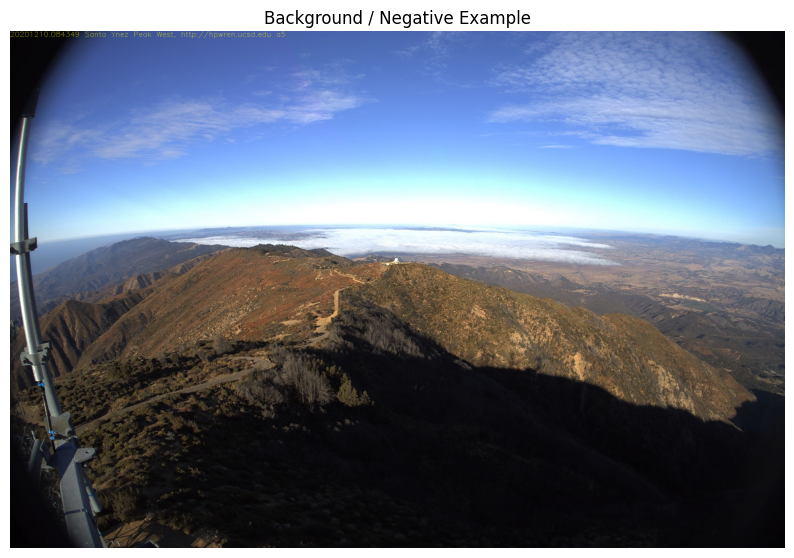

Sample 8/10: WEB06305.jpg


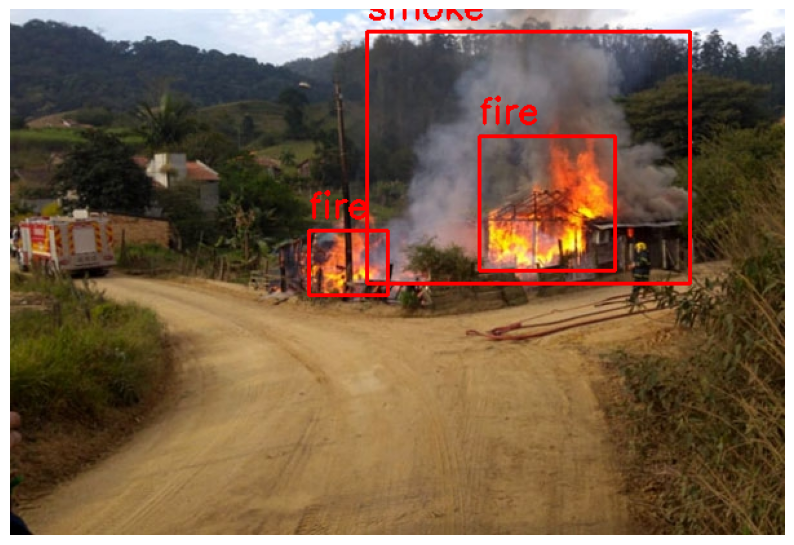

Sample 9/10: ruokolahti_DJI_0080_frame216.jpg


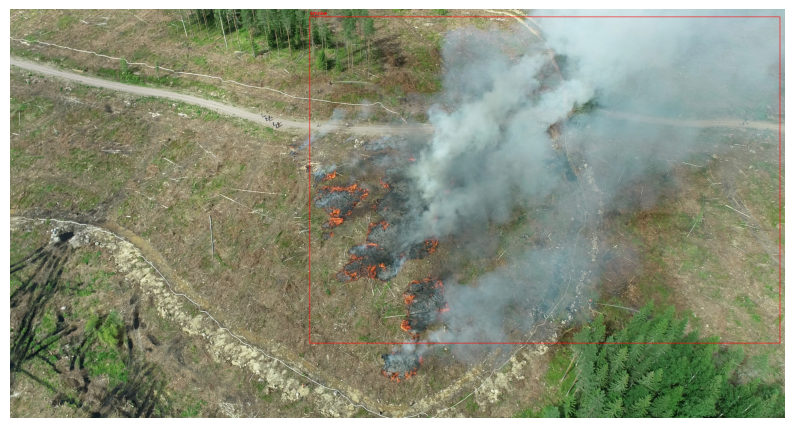

Sample 10/10: AoF02979.jpg


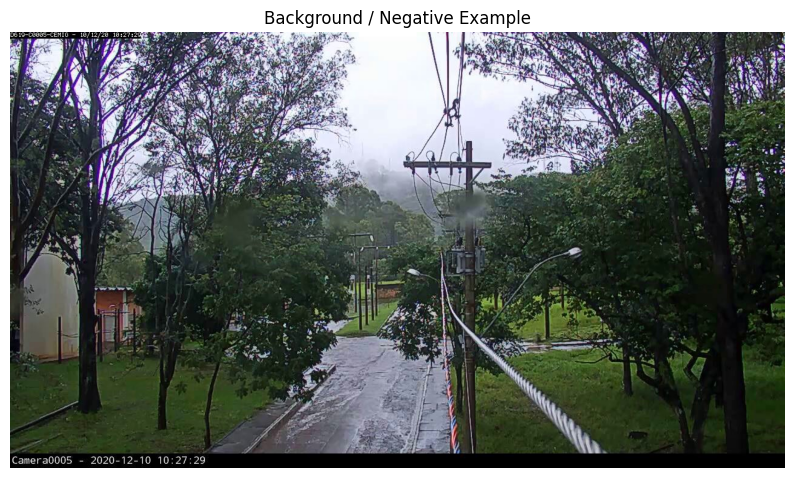


--- Verifying 10 samples from the TEST Split ---
Sample 1/10: WEB00803.jpg


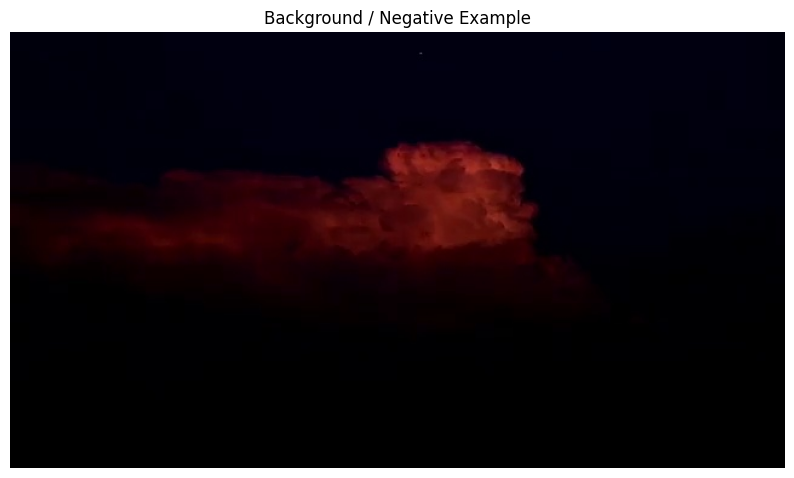

Sample 2/10: WEB10270.jpg


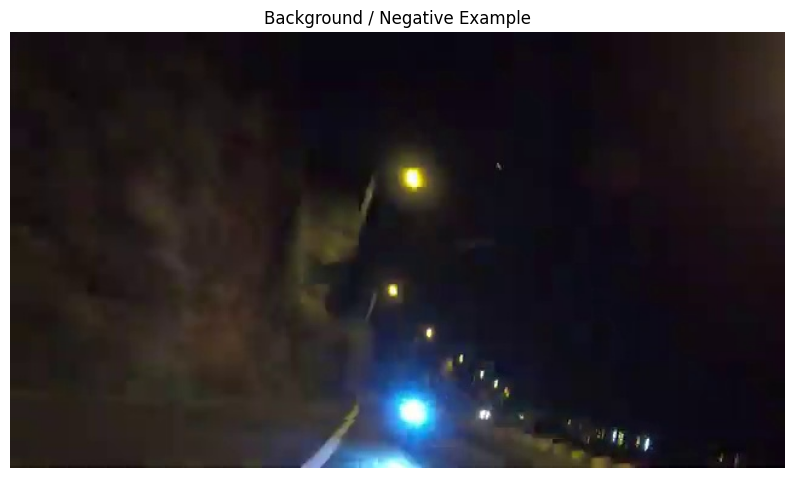

Sample 3/10: AoF00718.jpg


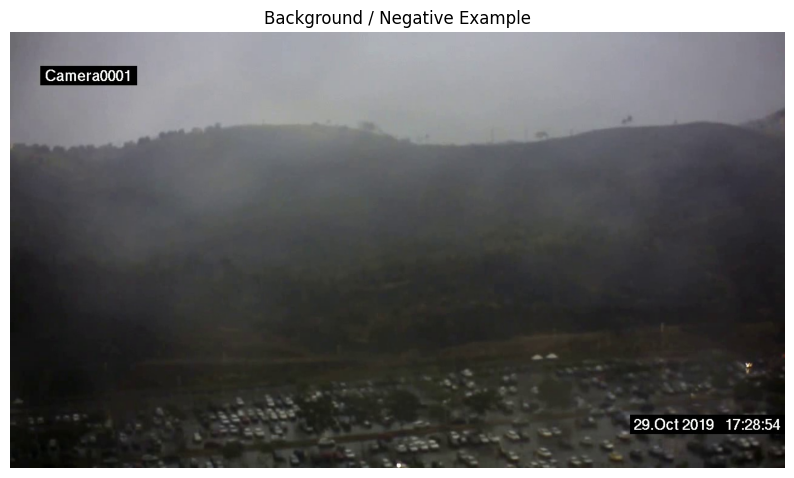

Sample 4/10: heinola_DJI_0029_frame7.jpg


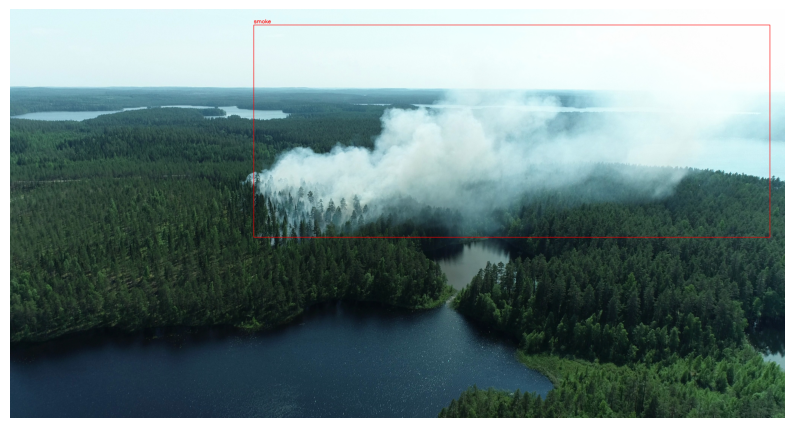

Sample 5/10: AoF08266.jpg


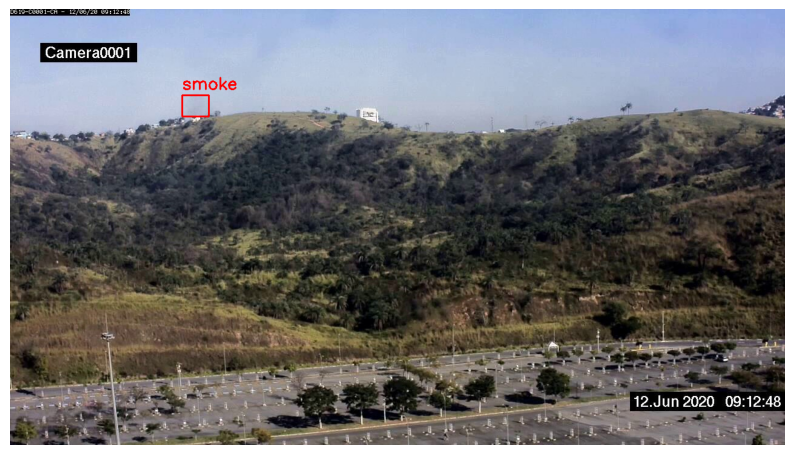

Sample 6/10: PublicDataset00337.jpg


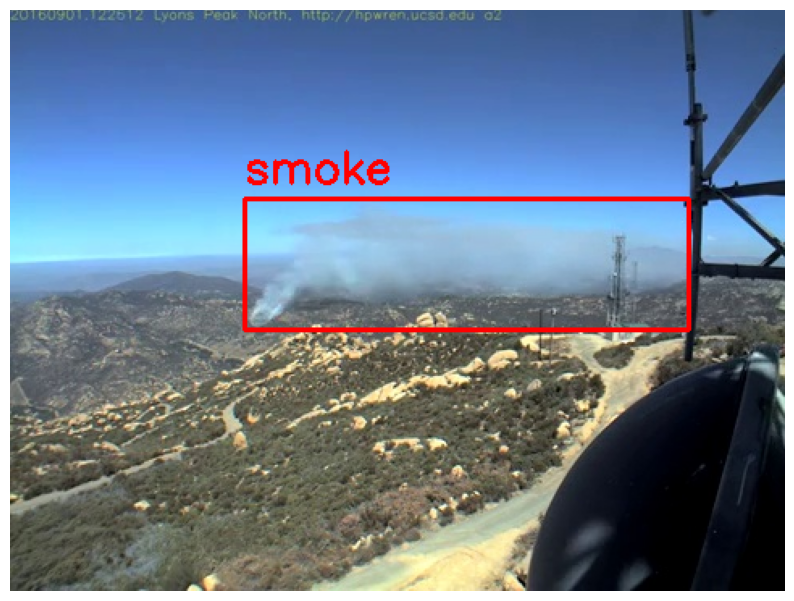

Sample 7/10: AoF07798.jpg


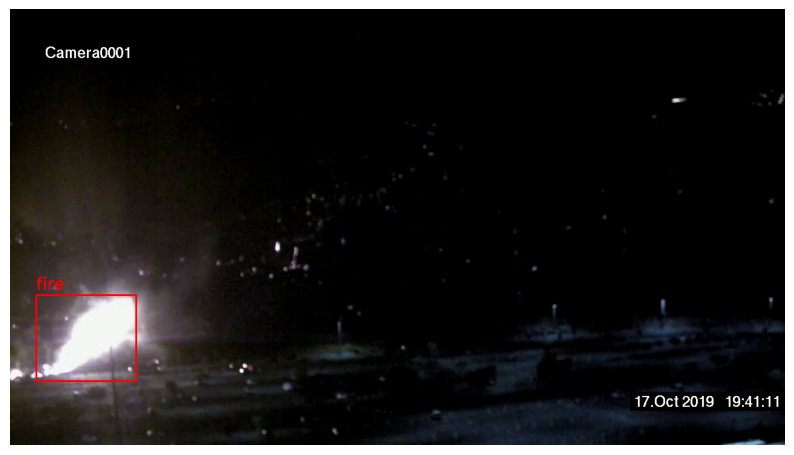

Sample 8/10: ruokolahti_DJI_0080_frame3.jpg


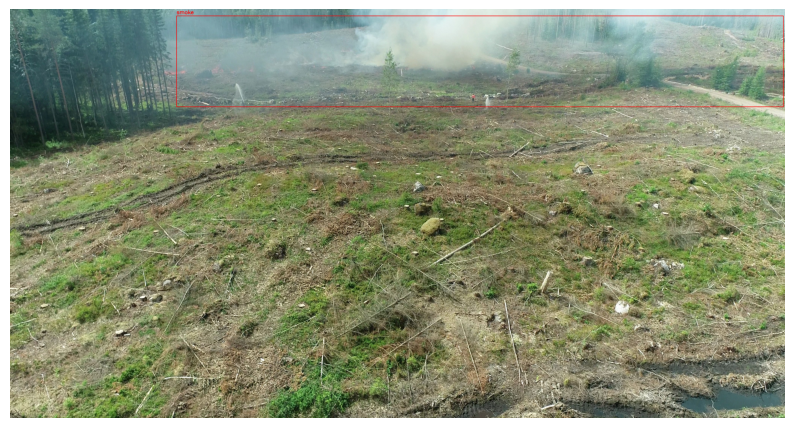

Sample 9/10: PublicDataset00011.jpg


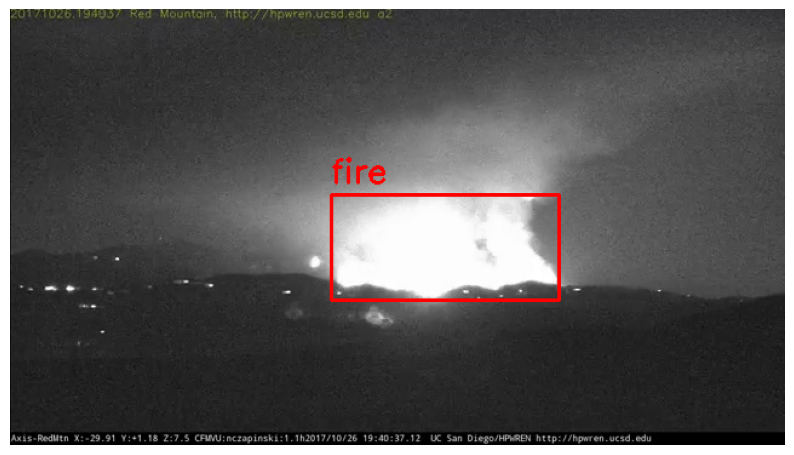

Sample 10/10: AoF08195.jpg


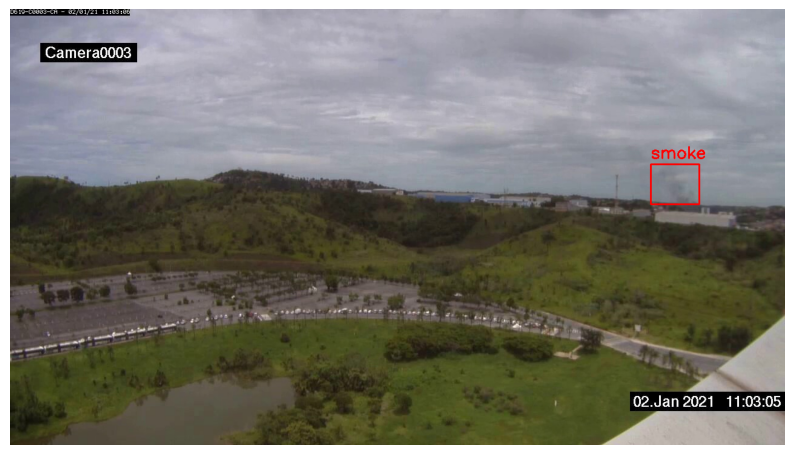

In [15]:
def verify_split_multiple(split_name, num_samples=30):
    """
    Verifies the split by loading and visualizing up to num_samples images.
    """
    split_images_dir = os.path.join(OUTPUT_DIR, split_name, 'images')
    split_labels_dir = os.path.join(OUTPUT_DIR, split_name, 'labels')
    
    # 1. Get all image paths
    all_images = glob.glob(os.path.join(split_images_dir, '*'))
    
    if not all_images:
        print(f"--- No images found in {split_name} ---")
        return
        
    # 2. Select a random sample of images (up to num_samples)
    samples_to_check = all_images if len(all_images) <= num_samples else random.sample(all_images, num_samples)
    
    print(f"\n--- Verifying {len(samples_to_check)} samples from the {split_name.upper()} Split ---")
    
    # 3. Iterate and visualize each sample
    for i, img_path in enumerate(samples_to_check):
        basename = os.path.splitext(os.path.basename(img_path))[0]
        label_path = os.path.join(split_labels_dir, basename + '.txt')
        
        # This will be printed to the console:
        print(f"Sample {i+1}/{len(samples_to_check)}: {os.path.basename(img_path)}")
        
        if os.path.exists(label_path):
            # This is where your visualization function runs (e.g., displaying the image in a Jupyter Notebook or a pop-up window)
            visualize_sample(img_path, label_path)
        else:
            # Important check for negative samples
            print(f"    -> Label file missing (Expected for Negative Sample: {basename}.txt)")
            # You might want to call visualize_sample(img_path, None) if your function handles empty labels
            # or simply visualize the image without boxes for verification.

verify_split_multiple('train', num_samples=10)
verify_split_multiple('valid', num_samples=10)
verify_split_multiple('test', num_samples=10)